<a href="https://colab.research.google.com/github/ShriSathiya/test/blob/main/Wheel_Vigiler_Milestone1_Sathiya_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><center>- Wheel Vigier -</center></h1>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


![sieve shaker](../data-warehouse/logo.png)

    -A Deep Learning based car identification model.

In [ ]:
# Project Context

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of the car, type, colour, number plates etc.</i></b><br>

In [ ]:
# Project Objective

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>Design a DL based car identification model.</i></b>

In [ ]:
# Project Summary

## Step import

In [2]:
# Import Block

import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import pandas as pd
import random
from skimage import io
from shutil import copyfile
import sys
import time
import albumentations as A


import random
import pprint
import sys
from optparse import OptionParser
import pickle
import math
import copy
import tensorflow as tf

from sklearn.metrics import average_precision_score

from keras import backend as K
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Flatten, Dense, Input, Conv2D, MaxPooling2D, Dropout
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, TimeDistributed
from tensorflow.keras.utils import get_source_inputs
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from tensorflow.keras.metrics import categorical_crossentropy

from keras.models import Model
from keras.utils import generic_utils
from tensorflow.keras.layers import Layer, InputSpec
from keras import initializers, regularizers

In [3]:
# TODO : Code here

In [4]:
# Static Constant Block

In [5]:
# TODO : Code Here

# Milestone - 1

## STEP 1 : Step 1: Import the data

In [8]:
BASE_PATH = "/content/drive/MyDrive/AIML/Capstone Project"

IMAGE_PATH = os.path.sep.join([BASE_PATH, "Car Images"])
TRAIN_IMAGE_PATH = os.path.sep.join([BASE_PATH, "Car Images/Train Images"])

ANNOT_PATH = os.path.sep.join([BASE_PATH, "Annotations"])
TRAIN_ANNOT_PATH = os.path.sep.join([BASE_PATH, "Annotations/Train Annotations.csv"])
TEST__ANNOT_PATH = os.path.sep.join([BASE_PATH, "Annotations/Test Annotation.csv"])

CLASS_PATH = os.path.sep.join([BASE_PATH, "CarNames.csv"])

In [9]:
# import zipfile
# with zipfile.ZipFile("/content/drive/MyDrive/AIML/Capstone Project/Car+Images.zip", 'r') as zip_ref:
#     zip_ref.extractall("/content/drive/MyDrive/AIML/Capstone Project/")

In [10]:
TRAIN_ANNOT = pd.read_csv(TRAIN_ANNOT_PATH)
TEST_ANNOT = pd.read_csv(TEST__ANNOT_PATH)

def map_image_to_class(imagefilepath, annotation, dataset):
    listOfFiles = list()
    listOfFileName = list()
    for (dirpath, dirnames, filenames) in os.walk(imagefilepath):
        listOfFiles += [os.path.join(dirpath, file) for file in filenames]
        listOfFileName += [os.path.join(file) for file in filenames] 
    ListOfFiles = pd.DataFrame({'filepath': listOfFiles,'Image Name': listOfFileName})   
    ListOfFiles = ListOfFiles[ListOfFiles['Image Name'] != '.DS_Store']
    ListOfFiles = ListOfFiles[ListOfFiles['filepath'].str.contains(dataset)]
    Data = annotation.merge(ListOfFiles, on='Image Name', how='left')
    Data['classname'] = Data["filepath"].str.extract(r'/.*/(.*)/')
    Data.columns = ['image', 'x1', 'y1', 'x2', 'y2', 'class', 'path', 'classname']
    return Data

In [12]:
TRAIN_DATA = map_image_to_class(IMAGE_PATH, TRAIN_ANNOT, 'Train' )
TEST_DATA = map_image_to_class(IMAGE_PATH, TEST_ANNOT, 'Test' )

## Step 2: Map training and testing images to its classes.

In [13]:
TRAIN_DATA[['image', 'path', 'class', 'classname']].head().style.set_properties(**{'background-color': 'blue',
                            'color': 'lawngreen',
                            'border-color': 'white'})

,image,path,class,classname
0,00001.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Audi TTS Coupe 2012/00001.jpg,14,Audi TTS Coupe 2012
1,00002.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Acura TL Sedan 2012/00002.jpg,3,Acura TL Sedan 2012
2,00003.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Dodge Dakota Club Cab 2007/00003.jpg,91,Dodge Dakota Club Cab 2007
3,00004.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Hyundai Sonata Hybrid Sedan 2012/00004.jpg,134,Hyundai Sonata Hybrid Sedan 2012
4,00005.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Ford F-450 Super Duty Crew Cab 2012/00005.jpg,106,Ford F-450 Super Duty Crew Cab 2012


In [14]:
TEST_DATA[['image', 'path', 'class', 'classname']].head().style.set_properties(**{'background-color': 'olive',
                            'color': 'blue',
                            'border-color': 'white'})

,image,path,class,classname
0,00001.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Suzuki Aerio Sedan 2007/00001.jpg,181,Suzuki Aerio Sedan 2007
1,00002.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Ferrari 458 Italia Convertible 2012/00002.jpg,103,Ferrari 458 Italia Convertible 2012
2,00003.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Jeep Patriot SUV 2012/00003.jpg,145,Jeep Patriot SUV 2012
3,00004.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Toyota Camry Sedan 2012/00004.jpg,187,Toyota Camry Sedan 2012
4,00005.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Tesla Model S Sedan 2012/00005.jpg,185,Tesla Model S Sedan 2012


## Step 3: Map training and testing images to its annotations.

In [15]:
TRAIN_DATA[['image', 'path', 'x1', 'y1', 'x2', 'y2']].head().style.set_properties(**{'background-color': 'blue',
                            'color': 'lawngreen',
                            'border-color': 'white'})

,image,path,x1,y1,x2,y2
0,00001.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Audi TTS Coupe 2012/00001.jpg,39,116,569,375
1,00002.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Acura TL Sedan 2012/00002.jpg,36,116,868,587
2,00003.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Dodge Dakota Club Cab 2007/00003.jpg,85,109,601,381
3,00004.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Hyundai Sonata Hybrid Sedan 2012/00004.jpg,621,393,1484,1096
4,00005.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Ford F-450 Super Duty Crew Cab 2012/00005.jpg,14,36,133,99


In [16]:
TEST_DATA[['image', 'path', 'x1', 'y1', 'x2', 'y2']].head().style.set_properties(**{'background-color': 'olive',
                            'color': 'blue',
                            'border-color': 'white'})

,image,path,x1,y1,x2,y2
0,00001.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Suzuki Aerio Sedan 2007/00001.jpg,30,52,246,147
1,00002.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Ferrari 458 Italia Convertible 2012/00002.jpg,100,19,576,203
2,00003.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Jeep Patriot SUV 2012/00003.jpg,51,105,968,659
3,00004.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Toyota Camry Sedan 2012/00004.jpg,67,84,581,407
4,00005.jpg,/content/drive/MyDrive/AIML/Capstone Project/Car Images/Test Images/Tesla Model S Sedan 2012/00005.jpg,140,151,593,339


## Step 4: Display images with bounding box

In [ ]:
def plot_bbox(img_id, dataset):
    image_path = dataset.loc[dataset["image"]==img_id]['path'].values[0]
    img = io.imread(image_path)
    height, width, channel = img.shape
    print(f"Image: {img.shape}")
    bboxs = dataset[dataset['image']==img_id]
    for index, row in bboxs.iterrows():        
        xmin = row['x1']
        xmax = row['x2']
        ymin = row['y1']
        ymax = row['y2']      
        label_name = row['classname']
        print(f"Coordinates: {xmin,ymin}, {xmax,ymax}")
        cv2.rectangle(img, (xmin,ymin), (xmax,ymax), (255,0,0), 5)
    plt.figure(figsize=(9,9))
    plt.title(label_name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

Image: (600, 800, 3)
Coordinates: (13, 154), (798, 466)


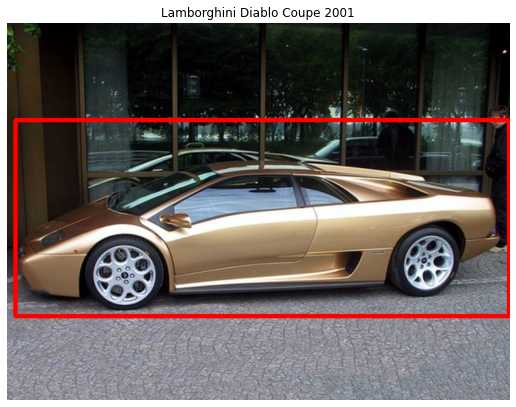

Image: (214, 285, 3)
Coordinates: (33, 52), (227, 166)


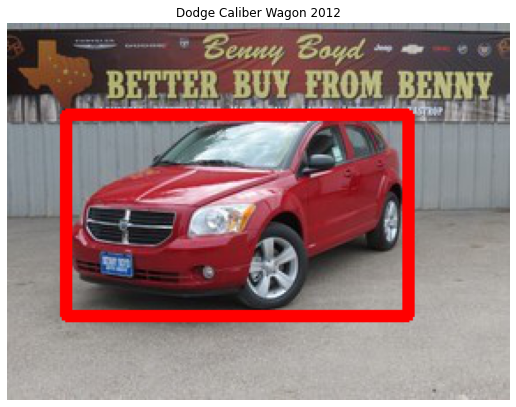

Image: (480, 640, 3)
Coordinates: (104, 67), (548, 409)


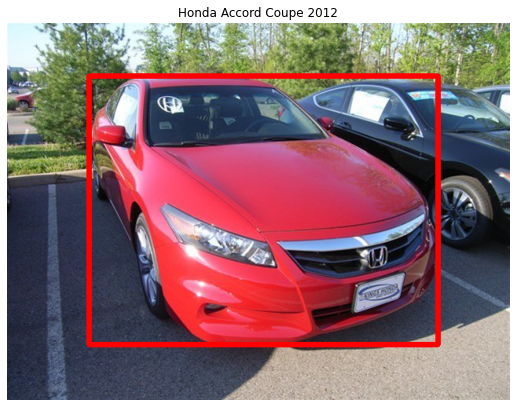

Image: (600, 800, 3)
Coordinates: (10, 93), (784, 537)


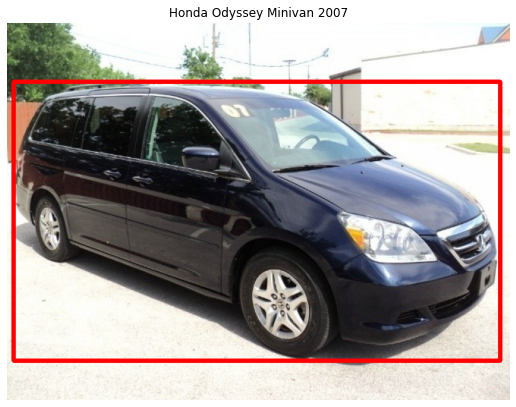

Image: (938, 1500, 3)
Coordinates: (78, 104), (1373, 845)


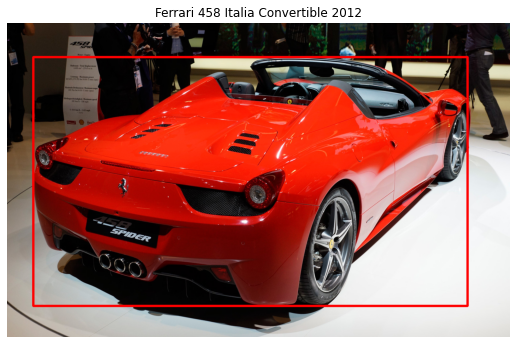

In [ ]:
least_objects_img_ids = TRAIN_DATA["image"].value_counts().tail(50).index.values

for img_id in random.sample(list(least_objects_img_ids), 5):
    plot_bbox(img_id, TRAIN_DATA)

## Step 5: Scatter plot image dimentions

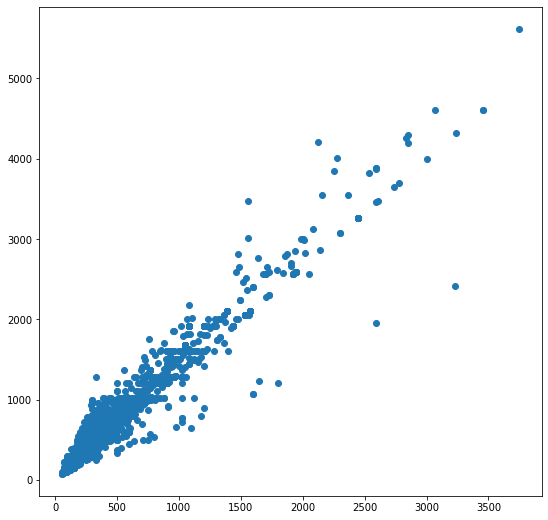

In [ ]:
# import hvplot.pandas
def get_dims(file):
    img = cv2.imread(file)
    h,w = img.shape[:2]
    return h,w
dim=[]
# parallelize
for i in TRAIN_DATA["path"]:
    dim_hw=get_dims(i)
    dim.append(dim_hw)
    
dim_df = pd.DataFrame(dim, columns=['height', 'width'])

plt.figure(figsize=(9, 9))

plt.scatter(dim_df.height, dim_df.width)


## Step 6: Plot bb on resized image

In [ ]:
image_size = 300
images = []
image_labels = []

def plot_bbox1(img_id, dataset):
    
    image_path = dataset.loc[dataset["image"]==img_id]['path'].values[0]
    img = io.imread(image_path)

    bboxs = dataset[dataset['image']==img_id]
    for index, row in bboxs.iterrows():
        height, width, channel = img.shape
        height, width = img.shape[:2]
        print(f"Original Image: {img.shape}")
        img=cv2.resize(img,(image_size,image_size))
        height1, width1 = img.shape[:2]
        print(f"Resized Image: {img.shape}")
        xmin = int(row['x1']*width1/width)
        xmax = int(row['x2']*width1/width)
        ymin = int(row['y1']*height1/height)
        ymax = int(row['y2']*height1/height)    
        label_name = row['classname']
        print(f"Coordinates: {xmin,ymin}, {xmax,ymax}")
        
        cv2.rectangle(img, (xmin,ymin), (xmax,ymax), (255,0,0), 5)
        
        images.append(img)
        image_labels.append(label_name)
        
    plt.figure(figsize=(9,9))
    plt.title(label_name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

Original Image: (400, 600, 3)
Resized Image: (300, 300, 3)
Coordinates: (19, 87), (284, 281)


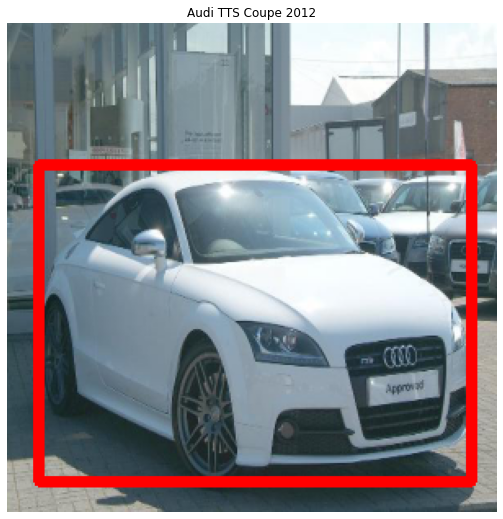

In [ ]:
# least_objects_img_ids = TRAIN_DATA["image"].value_counts().tail(50).index.values

# for img_id in random.sample(list(least_objects_img_ids), 5):
plot_bbox1('00001.jpg', TRAIN_DATA)

## Step 7: Image size analysis

In [ ]:
import imagesize
img_meta = {}
for i in TRAIN_DATA['path']:
    img_meta[str(i)] = imagesize.get(i)
img_meta_df = pd.DataFrame.from_dict([img_meta]).T.reset_index().set_axis(['FileName', 'Size'], axis='columns', inplace=False)
img_meta_df[["Width", "Height"]] = pd.DataFrame(img_meta_df["Size"].tolist(), index=img_meta_df.index)
img_meta_df["Aspect Ratio"] = round(img_meta_df["Width"] / img_meta_df["Height"], 2)

print(f'Total Nr of Images in the dataset: {len(img_meta_df)}')
img_meta_df.head()

Total Nr of Images in the dataset: 8144


,FileName,Size,Width,Height,Aspect Ratio
0,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,"(600, 400)",600,400,1.50
1,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,"(900, 675)",900,675,1.33
2,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,"(640, 480)",640,480,1.33
3,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,"(2100, 1386)",2100,1386,1.52
4,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,"(144, 108)",144,108,1.33


Text(0, 0.5, 'Height')

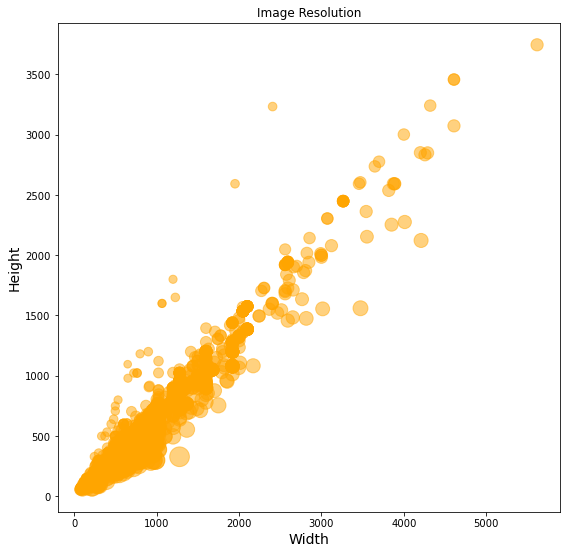

In [ ]:
fig = plt.figure(figsize=(9, 9))
ax = fig.add_subplot(111)
points = ax.scatter(img_meta_df.Width, img_meta_df.Height, color='orange', alpha=0.5, s=img_meta_df["Aspect Ratio"]*100, picker=True)
ax.set_title("Image Resolution")
ax.set_xlabel("Width", size=14)
ax.set_ylabel("Height", size=14)

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>We have plot the image resolution. From this picture, we clearly see that most of the images are of size betweeen 0 and 2000.</i></b>

<ipython-input-20-d93a26de3a3d>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = fig.add_subplot(111)


Text(0, 0.5, 'Height')

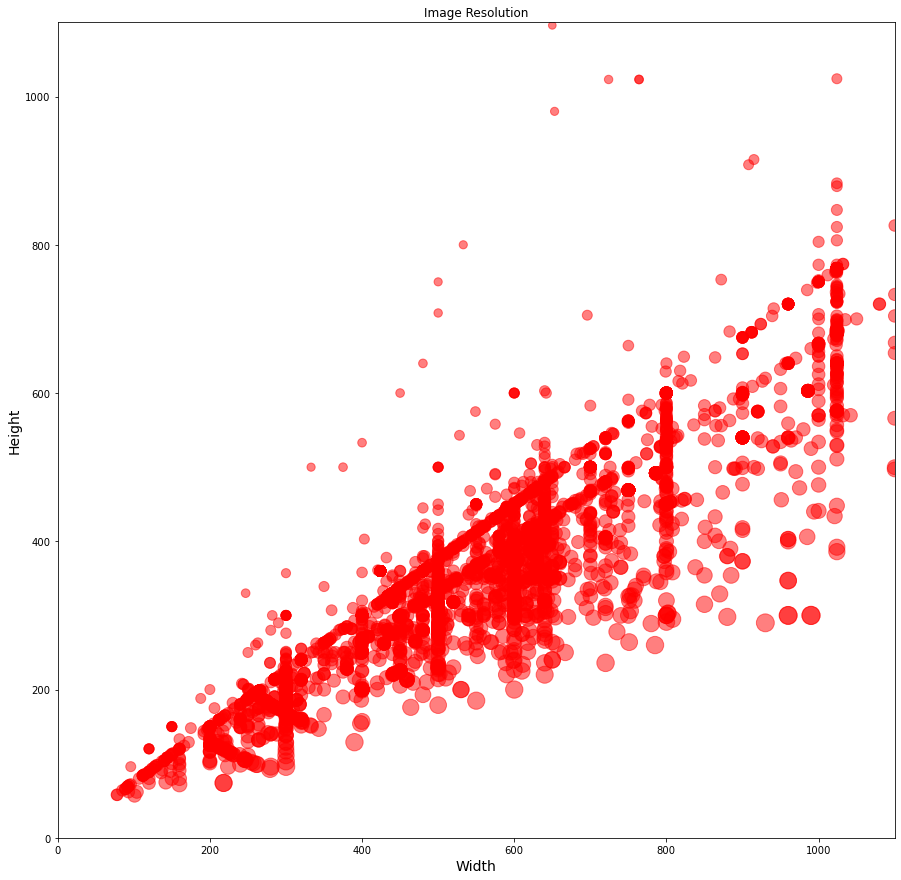

In [ ]:
fig = plt.figure(figsize=(15, 15))
plt.xlim(0, 1100)
plt.ylim(0, 1100)
ax = fig.add_subplot(111)
points = ax.scatter(img_meta_df.Width, img_meta_df.Height, color='red', alpha=0.5, s=img_meta_df["Aspect Ratio"]*100, picker=True)
ax.set_title("Image Resolution")
ax.set_xlabel("Width", size=14)
ax.set_ylabel("Height", size=14)

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>After zooming the height vs width scatter plot, we see that image sizes are clustered between 500 - 700 width and 200 - 500 height. There are also small clusters around 100 - 300 width and 100 - 200 height.</i></b>

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>Let's check if any more clusters above 1000 xlim.</i></b>

<ipython-input-21-2627f47987c2>:4: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = fig.add_subplot(111)


Text(0, 0.5, 'Height')

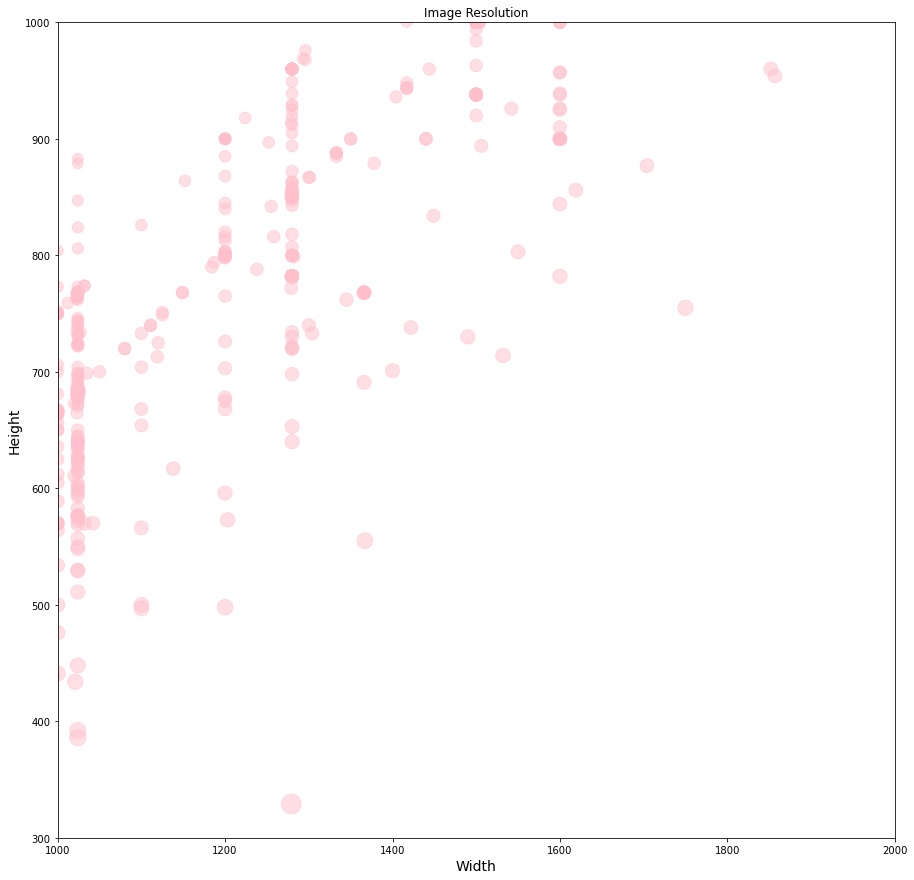

In [ ]:
fig = plt.figure(figsize=(15, 15))
plt.xlim(1000, 2000)
plt.ylim(300, 1000)
ax = fig.add_subplot(111)
points = ax.scatter(img_meta_df.Width, img_meta_df.Height, color='pink', alpha=0.5, s=img_meta_df["Aspect Ratio"]*100, picker=True)
ax.set_title("Image Resolution")
ax.set_xlabel("Width", size=14)
ax.set_ylabel("Height", size=14)

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>We see very few pictures having high resolution. From the above plots, we learn that it is good to start the training with image size of 450 then can try with size of 500 or 600 or 700.</i></b>

## Step 8: Reading car number

® ONTARIO ®

BMKH? 06

YOURS TO DISCOVER

e

 



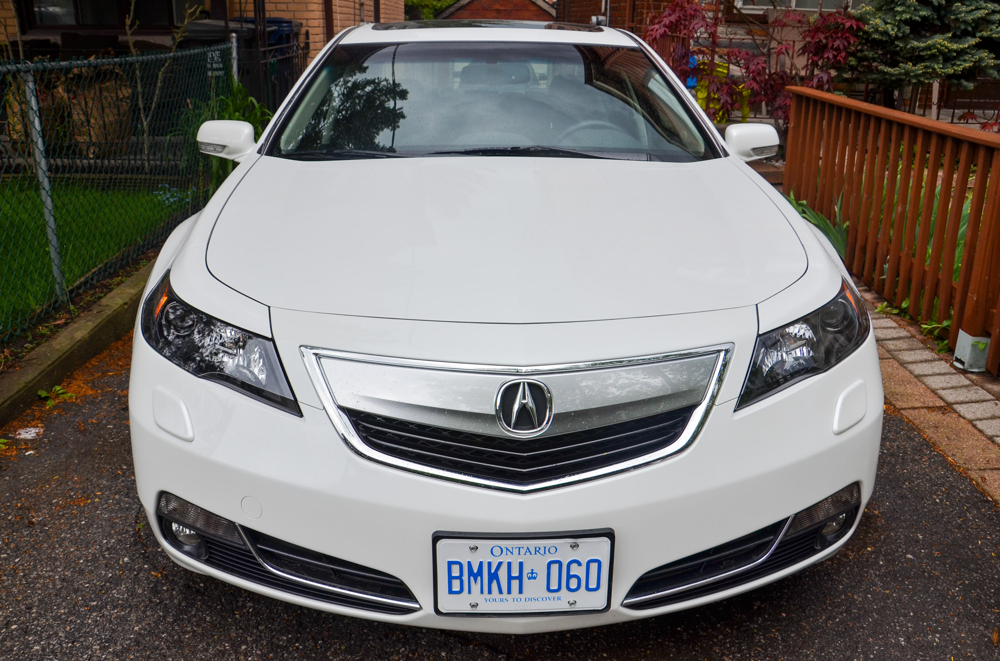

In [ ]:
from PIL import Image

import pytesseract

pytesseract.pytesseract.tesseract_cmd = r'/Users/sathya/Desktop/Learning/Cellar/tesseract/4.1.1/bin/tesseract'
im = Image.open(r'/Users/sathya/Desktop/Learning/AIML/AIML_GL_CapstoneProject/Car Images/Train Images/Acura TL Sedan 2012/02364.jpg')
text_from_image = pytesseract.image_to_string(im)
print(text_from_image)

display(im)

><span style="font-family: Times New Roman; font-weight:bold;font-size:1em;color:blue;"><b><i>We observed that not all the car images having car numbers. As seen above, this car's number plate is clearly visible and we have extracted the text using OCR.</i></b>

## Step 9: Model per year distribution

In [ ]:
model_names =pd.read_csv(CLASS_PATH)
model_names =pd.DataFrame(model_names)
model_names.columns = ['ModelNames']

print(model_names.shape)
for i in model_names['ModelNames']:
    model_names['year']=model_names['ModelNames'].str[-4:]
    
model_names['year'].head(5)

(196, 1)


0    2000
1    2012
2    2012
3    2008
4    2012
Name: year, dtype: object

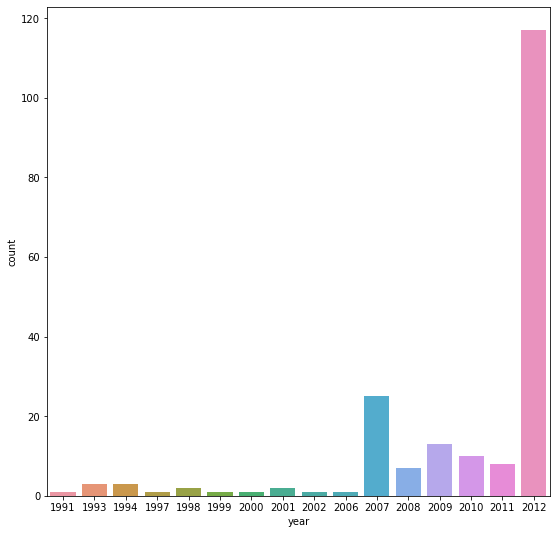

In [ ]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(9, 9))
ax = sns.countplot(data=model_names, x='year')

## Step 10: Model name and year distribution

In [ ]:
for i in model_names['ModelNames']:
    model_names['company']=model_names['ModelNames'].str.extract(pat = '(\w+\s)')
    
model_names['company']

0              AM 
1           Acura 
2           Acura 
3           Acura 
4           Acura 
          ...     
191    Volkswagen 
192         Volvo 
193         Volvo 
194         Volvo 
195         smart 
Name: company, Length: 196, dtype: object

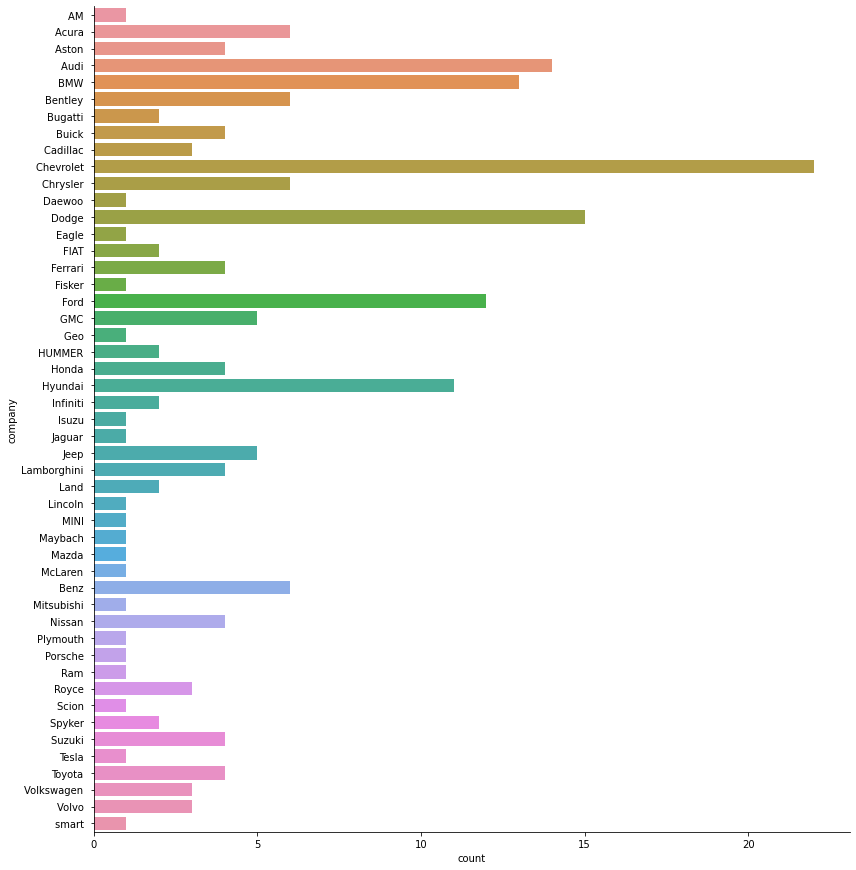

In [ ]:
ax = sns.catplot(y="company",
                kind="count",
                data=model_names,height=12)

## Step 11: Data preprocessing

In [17]:
TRAIN_DATA.head()

,image,x1,y1,x2,y2,class,path,classname
0,00001.jpg,39,116,569,375,14,/content/drive/MyDrive/AIML/Capstone Project/C...,Audi TTS Coupe 2012
1,00002.jpg,36,116,868,587,3,/content/drive/MyDrive/AIML/Capstone Project/C...,Acura TL Sedan 2012
2,00003.jpg,85,109,601,381,91,/content/drive/MyDrive/AIML/Capstone Project/C...,Dodge Dakota Club Cab 2007
3,00004.jpg,621,393,1484,1096,134,/content/drive/MyDrive/AIML/Capstone Project/C...,Hyundai Sonata Hybrid Sedan 2012
4,00005.jpg,14,36,133,99,106,/content/drive/MyDrive/AIML/Capstone Project/C...,Ford F-450 Super Duty Crew Cab 2012


In [18]:
train_df=TRAIN_DATA.drop(columns=['class'], axis=0)
train_df.head()

,image,x1,y1,x2,y2,path,classname
0,00001.jpg,39,116,569,375,/content/drive/MyDrive/AIML/Capstone Project/C...,Audi TTS Coupe 2012
1,00002.jpg,36,116,868,587,/content/drive/MyDrive/AIML/Capstone Project/C...,Acura TL Sedan 2012
2,00003.jpg,85,109,601,381,/content/drive/MyDrive/AIML/Capstone Project/C...,Dodge Dakota Club Cab 2007
3,00004.jpg,621,393,1484,1096,/content/drive/MyDrive/AIML/Capstone Project/C...,Hyundai Sonata Hybrid Sedan 2012
4,00005.jpg,14,36,133,99,/content/drive/MyDrive/AIML/Capstone Project/C...,Ford F-450 Super Duty Crew Cab 2012


In [19]:


# # for training
# with open("/Users/sathya/Desktop/Learning/AIML/AIML_GL_CapstoneProject/Annotations/annotation.csv", "a") as f:
#     for idx, row in train_df.iterrows():
#         img = cv2.imread(row['path'])
#         #print(img)  #none 
#         height, width = img.shape[:2]
#         x1 = int(row['x1'] * width)
#         x2 = int(row['x2'] * width)
#         y1 = int(row['y1'] * height)
#         y2 = int(row['y2'] * height)

#         fileName = row['path']
#         className = row['classname']
#         f.write(fileName + ',' + str(x1) + ',' + str(y1) + ',' + str(x2) + ',' + str(y2) + ',' + className + '\n')

# print('done')

##Config

In [ ]:
class Config:

    def __init__(self):

        self.verbose = True
        self.network = 'vgg'


        self.use_horizontal_flips = False
        self.use_vertical_flips = False
        self.rot_90 = False

        self.anchor_box_scales = [64, 128, 256] 

        self.anchor_box_ratios = [[1, 1], [1./math.sqrt(2), 2./math.sqrt(2)], [2./math.sqrt(2), 1./math.sqrt(2)]]

        self.im_size = 300

        self.img_channel_mean = [103.939, 116.779, 123.68]
        self.img_scaling_factor = 1.0

        self.num_rois = 4

        self.rpn_stride = 16

        self.balanced_classes = False

        self.std_scaling = 4.0
        self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

        self.rpn_min_overlap = 0.3
        self.rpn_max_overlap = 0.7

        self.classifier_min_overlap = 0.1
        self.classifier_max_overlap = 0.5

        self.class_mapping = None

        self.model_path = None

##Get data

In [ ]:
def get_data(input_path):
	"""Parse the data from annotation file
	
	Args:
		input_path: annotation file path

	Returns:
		all_data: list(filepath, width, height, list(bboxes))
		classes_count: dict{key:class_name, value:count_num} 
			e.g. {'Car': 2383, 'Mobile phone': 1108, 'Person': 3745}
		class_mapping: dict{key:class_name, value: idx}
			e.g. {'Car': 0, 'Mobile phone': 1, 'Person': 2}
	"""
	found_bg = False
	all_imgs = {}

	classes_count = {}

	class_mapping = {}

	visualise = True

	i = 1
	
	with open(input_path,'r') as f:

		print('Parsing annotation files')

		for line in f:

			# Print process
			sys.stdout.write('\r'+'idx=' + str(i))
			i += 1

			line_split = line.strip().split(',')

			(filename,x1,y1,x2,y2,class_name) = line_split

			if class_name not in classes_count:
				classes_count[class_name] = 1
			else:
				classes_count[class_name] += 1

			if class_name not in class_mapping:
				if class_name == 'bg' and found_bg == False:
					print('Found class name with special name bg. Will be treated as a background region (this is usually for hard negative mining).')
					found_bg = True
				class_mapping[class_name] = len(class_mapping)

			if filename not in all_imgs:
				all_imgs[filename] = {}
				
				img = cv2.imread(filename)
				(rows,cols) = img.shape[:2]
				all_imgs[filename]['filepath'] = filename
				all_imgs[filename]['width'] = cols
				all_imgs[filename]['height'] = rows
				all_imgs[filename]['bboxes'] = []
				
			all_imgs[filename]['bboxes'].append({'class': class_name, 'x1': int(x1), 'x2': int(x2), 'y1': int(y1), 'y2': int(y2)})


		all_data = []
		for key in all_imgs:
			all_data.append(all_imgs[key])
		
		# make sure the bg class is last in the list
		if found_bg:
			if class_mapping['bg'] != len(class_mapping) - 1:
				key_to_switch = [key for key in class_mapping.keys() if class_mapping[key] == len(class_mapping)-1][0]
				val_to_switch = class_mapping['bg']
				class_mapping['bg'] = len(class_mapping) - 1
				class_mapping[key_to_switch] = val_to_switch
		
		return all_data, classes_count, class_mapping

##ROI

In [ ]:
class RoiPoolingConv(Layer):
    
    def __init__(self, pool_size, num_rois, **kwargs):
        print(pool_size)
        print(num_rois)
        self.dim_ordering = K.image_data_format()
        self.pool_size = pool_size
        self.num_rois = num_rois
        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]   

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):
        assert(len(x) == 2)
        img = x[0]
        rois = x[1]
        input_shape = K.shape(img)
        outputs = []
        for roi_idx in range(self.num_rois):

            x = rois[0, roi_idx, 0]
            y = rois[0, roi_idx, 1]
            w = rois[0, roi_idx, 2]
            h = rois[0, roi_idx, 3]

            x = K.cast(x, 'int32')
            y = K.cast(y, 'int32')
            w = K.cast(w, 'int32')
            h = K.cast(h, 'int32')

            rs = tf.image.resize_images(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))
            outputs.append(rs)
    
        final_output = K.concatenate(outputs, axis=0)
        final_output = K.reshape(final_output, (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels))
        final_output = K.permute_dimensions(final_output, (0, 1, 2, 3, 4))

        return final_output
    
    def get_config(self):
        config = {'pool_size': self.pool_size,
                  'num_rois': self.num_rois}
        base_config = super(RoiPoolingConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)    

def nn_base(input_tensor=None, trainable=False):


    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3

    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    return x

In [ ]:
def rpn_layer(base_layers, num_anchors):

    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

In [ ]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes = 4):
    

    input_shape = (num_rois,7,7,512)

    pooling_regions = 7

    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])

    # Flatten the convlutional layer and connected to 2 FC and 2 dropout
    out = TimeDistributed(Flatten(name='flatten'))(out_roi_pool)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc1'))(out)
    out = TimeDistributed(Dropout(0.5))(out)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc2'))(out)
    out = TimeDistributed(Dropout(0.5))(out)

    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)

    return [out_class, out_regr]

In [ ]:
def union(au, bu, area_intersection):
    area_a = (au[2] - au[0]) * (au[3] - au[1])
    area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
    area_union = area_a + area_b - area_intersection
    return area_union


def intersection(ai, bi):
    x = max(ai[0], bi[0])
    y = max(ai[1], bi[1])
    w = min(ai[2], bi[2]) - x
    h = min(ai[3], bi[3]) - y
    if w < 0 or h < 0:
        return 0

    return w*h


def iou(a, b):

    if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
        return 0.0

    area_i = intersection(a, b)
    area_u = union(a, b, area_i)

    return float(area_i) / float(area_u + 1e-6)

In [ ]:
#Get new image size and augment the image

def get_new_img_size(width, height, img_min_side=300):
    if width <= height:
        f = float(img_min_side) / width
        resized_height = int(f * height)
        resized_width = img_min_side
    else:
        f = float(img_min_side) / height
        resized_width = int(f * width)
        resized_height = img_min_side

    return resized_width, resized_height

def augment(img_data, config, augment=True):
    assert 'filepath' in img_data
    assert 'bboxes' in img_data
    assert 'width' in img_data
    assert 'height' in img_data

    img_data_aug = copy.deepcopy(img_data)

    img = cv2.imread(img_data_aug['filepath'])

    if augment:
        rows, cols = img.shape[:2]

        if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
            img = cv2.flip(img, 1)
            for bbox in img_data_aug['bboxes']:
                x1 = bbox['x1']
                x2 = bbox['x2']
                bbox['x2'] = cols - x1
                bbox['x1'] = cols - x2

        if config.use_vertical_flips and np.random.randint(0, 2) == 0:
            img = cv2.flip(img, 0)
            for bbox in img_data_aug['bboxes']:
                y1 = bbox['y1']
                y2 = bbox['y2']
                bbox['y2'] = rows - y1
                bbox['y1'] = rows - y2

        if config.rot_90:
            angle = np.random.choice([0,90,180,270],1)[0]
            if angle == 270:
                img = np.transpose(img, (1,0,2))
                img = cv2.flip(img, 0)
            elif angle == 180:
                img = cv2.flip(img, -1)
            elif angle == 90:
                img = np.transpose(img, (1,0,2))
                img = cv2.flip(img, 1)
            elif angle == 0:
                pass

            for bbox in img_data_aug['bboxes']:
                x1 = bbox['x1']
                x2 = bbox['x2']
                y1 = bbox['y1']
                y2 = bbox['y2']
                if angle == 270:
                    bbox['x1'] = y1
                    bbox['x2'] = y2
                    bbox['y1'] = cols - x2
                    bbox['y2'] = cols - x1
                elif angle == 180:
                    bbox['x2'] = cols - x1
                    bbox['x1'] = cols - x2
                    bbox['y2'] = rows - y1
                    bbox['y1'] = rows - y2
                elif angle == 90:
                    bbox['x1'] = rows - y2
                    bbox['x2'] = rows - y1
                    bbox['y1'] = x1
                    bbox['y2'] = x2        
                elif angle == 0:
                    pass

    img_data_aug['width'] = img.shape[1]
    img_data_aug['height'] = img.shape[0]
    return img_data_aug, img

In [ ]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):

    while True:

        for img_data in all_img_data:
            try:

                # read in image, and optionally add augmentation

                if mode == 'train':
                    img_data_aug, x_img = augment(img_data, C, augment=True)
                else:
                    img_data_aug, x_img = augment(img_data, C, augment=False)

                (width, height) = (img_data_aug['width'], img_data_aug['height'])
                (rows, cols, _) = x_img.shape

                assert cols == width
                assert rows == height

                # get image dimensions for resizing
                (resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

                # resize the image so that smalles side is length = 300px
                x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
                debug_img = x_img.copy()

                try:
                    y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
                except:
                    continue

                # Zero-center by mean pixel, and preprocess image

                x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
                x_img = x_img.astype(np.float32)
                x_img[:, :, 0] -= C.img_channel_mean[0]
                x_img[:, :, 1] -= C.img_channel_mean[1]
                x_img[:, :, 2] -= C.img_channel_mean[2]
                x_img /= C.img_scaling_factor

                x_img = np.transpose(x_img, (2, 0, 1))
                x_img = np.expand_dims(x_img, axis=0)

                y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling

                x_img = np.transpose(x_img, (0, 2, 3, 1))
                y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
                y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))

                yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos

            except Exception as e:
                print(e)
                continue

In [ ]:
lambda_rpn_regr = 1.0
lambda_rpn_class = 1.0

lambda_cls_regr = 1.0
lambda_cls_class = 1.0

epsilon = 1e-4

In [ ]:
def rpn_loss_regr(num_anchors):
    
    def rpn_loss_regr_fixed_num(y_true, y_pred):

        x = y_true[:, :, :, 4 * num_anchors:] - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), tf.float32)

        return lambda_rpn_regr * K.sum(
            y_true[:, :, :, :4 * num_anchors] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :, :4 * num_anchors])
    return rpn_loss_regr_fixed_num


def rpn_loss_cls(num_anchors):
    def rpn_loss_cls_fixed_num(y_true, y_pred):

            return lambda_rpn_class * K.sum(y_true[:, :, :, :num_anchors] * K.binary_crossentropy(y_pred[:, :, :, :], y_true[:, :, :, num_anchors:])) / K.sum(epsilon + y_true[:, :, :, :num_anchors])

    return rpn_loss_cls_fixed_num


def class_loss_regr(num_classes):
    def class_loss_regr_fixed_num(y_true, y_pred):
        x = y_true[:, :, 4*num_classes:] - y_pred
        x_abs = K.abs(x)
        x_bool = K.cast(K.less_equal(x_abs, 1.0), 'float32')
        return lambda_cls_regr * K.sum(y_true[:, :, :4*num_classes] * (x_bool * (0.5 * x * x) + (1 - x_bool) * (x_abs - 0.5))) / K.sum(epsilon + y_true[:, :, :4*num_classes])
    return class_loss_regr_fixed_num


def class_loss_cls(y_true, y_pred):
    return lambda_cls_class * K.mean(categorical_crossentropy(y_true[0, :, :], y_pred[0, :, :]))

In [ ]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
    if len(boxes) == 0:
        return []

    # grab the coordinates of the bounding boxes
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    np.testing.assert_array_less(x1, x2)
    np.testing.assert_array_less(y1, y2)

    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")

    pick = []

    area = (x2 - x1) * (y2 - y1)

    idxs = np.argsort(probs)

    while len(idxs) > 0:

        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        xx1_int = np.maximum(x1[i], x1[idxs[:last]])
        yy1_int = np.maximum(y1[i], y1[idxs[:last]])
        xx2_int = np.minimum(x2[i], x2[idxs[:last]])
        yy2_int = np.minimum(y2[i], y2[idxs[:last]])

        ww_int = np.maximum(0, xx2_int - xx1_int)
        hh_int = np.maximum(0, yy2_int - yy1_int)

        area_int = ww_int * hh_int

        area_union = area[i] + area[idxs[:last]] - area_int

        overlap = area_int/(area_union + 1e-6)

        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlap_thresh)[0])))

        if len(pick) >= max_boxes:
            break

    boxes = boxes[pick].astype("int")
    probs = probs[pick]
    return boxes, probs

def apply_regr_np(X, T):

    try:
        x = X[0, :, :]
        y = X[1, :, :]
        w = X[2, :, :]
        h = X[3, :, :]

        tx = T[0, :, :]
        ty = T[1, :, :]
        tw = T[2, :, :]
        th = T[3, :, :]

        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy

        w1 = np.exp(tw.astype(np.float64)) * w
        h1 = np.exp(th.astype(np.float64)) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.

        x1 = np.round(x1)
        y1 = np.round(y1)
        w1 = np.round(w1)
        h1 = np.round(h1)
        return np.stack([x1, y1, w1, h1])
    except Exception as e:
        print(e)
        return X
    
def apply_regr(x, y, w, h, tx, ty, tw, th):

    try:
        cx = x + w/2.
        cy = y + h/2.
        cx1 = tx * w + cx
        cy1 = ty * h + cy
        w1 = math.exp(tw) * w
        h1 = math.exp(th) * h
        x1 = cx1 - w1/2.
        y1 = cy1 - h1/2.
        x1 = int(round(x1))
        y1 = int(round(y1))
        w1 = int(round(w1))
        h1 = int(round(h1))

        return x1, y1, w1, h1

    except ValueError:
        return x, y, w, h
    except OverflowError:
        return x, y, w, h
    except Exception as e:
        print(e)
        return x, y, w, h

def calc_iou(R, img_data, C, class_mapping):
    """Converts from (x1,y1,x2,y2) to (x,y,w,h) format

    Args:
        R: bboxes, probs
    """
    bboxes = img_data['bboxes']
    (width, height) = (img_data['width'], img_data['height'])
    # get image dimensions for resizing
    (resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

    gta = np.zeros((len(bboxes), 4))

    for bbox_num, bbox in enumerate(bboxes):
        # get the GT box coordinates, and resize to account for image resizing
        # gta[bbox_num, 0] = (40 * (600 / 800)) / 16 = int(round(1.875)) = 2 (x in feature map)
        gta[bbox_num, 0] = int(round(bbox['x1'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 1] = int(round(bbox['x2'] * (resized_width / float(width))/C.rpn_stride))
        gta[bbox_num, 2] = int(round(bbox['y1'] * (resized_height / float(height))/C.rpn_stride))
        gta[bbox_num, 3] = int(round(bbox['y2'] * (resized_height / float(height))/C.rpn_stride))

    x_roi = []
    y_class_num = []
    y_class_regr_coords = []
    y_class_regr_label = []
    IoUs = [] # for debugging only

    # R.shape[0]: number of bboxes (=300 from non_max_suppression)
    for ix in range(R.shape[0]):
        (x1, y1, x2, y2) = R[ix, :]
        x1 = int(round(x1))
        y1 = int(round(y1))
        x2 = int(round(x2))
        y2 = int(round(y2))

        best_iou = 0.0
        best_bbox = -1
        # Iterate through all the ground-truth bboxes to calculate the iou
        for bbox_num in range(len(bboxes)):
            curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1, y1, x2, y2])

            # Find out the corresponding ground-truth bbox_num with larget iou
            if curr_iou > best_iou:
                best_iou = curr_iou
                best_bbox = bbox_num

        if best_iou < C.classifier_min_overlap:
                continue
        else:
            w = x2 - x1
            h = y2 - y1
            x_roi.append([x1, y1, w, h])
            IoUs.append(best_iou)

            if C.classifier_min_overlap <= best_iou < C.classifier_max_overlap:
                # hard negative example
                cls_name = 'bg'
            elif C.classifier_max_overlap <= best_iou:
                cls_name = bboxes[best_bbox]['class']
                cxg = (gta[best_bbox, 0] + gta[best_bbox, 1]) / 2.0
                cyg = (gta[best_bbox, 2] + gta[best_bbox, 3]) / 2.0

                cx = x1 + w / 2.0
                cy = y1 + h / 2.0

                tx = (cxg - cx) / float(w)
                ty = (cyg - cy) / float(h)
                tw = np.log((gta[best_bbox, 1] - gta[best_bbox, 0]) / float(w))
                th = np.log((gta[best_bbox, 3] - gta[best_bbox, 2]) / float(h))
            else:
                print('roi = {}'.format(best_iou))
                raise RuntimeError

        class_num = class_mapping[cls_name]
        class_label = len(class_mapping) * [0]
        class_label[class_num] = 1
        y_class_num.append(copy.deepcopy(class_label))
        coords = [0] * 4 * (len(class_mapping) - 1)
        labels = [0] * 4 * (len(class_mapping) - 1)
        if cls_name != 'bg':
            label_pos = 4 * class_num
            sx, sy, sw, sh = C.classifier_regr_std
            coords[label_pos:4+label_pos] = [sx*tx, sy*ty, sw*tw, sh*th]
            labels[label_pos:4+label_pos] = [1, 1, 1, 1]
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))
        else:
            y_class_regr_coords.append(copy.deepcopy(coords))
            y_class_regr_label.append(copy.deepcopy(labels))

    if len(x_roi) == 0:
        return None, None, None, None

    # bboxes that iou > C.classifier_min_overlap for all gt bboxes in 300 non_max_suppression bboxes
    X = np.array(x_roi)
    # one hot code for bboxes from above => x_roi (X)
    Y1 = np.array(y_class_num)
    # corresponding labels and corresponding gt bboxes
    Y2 = np.concatenate([np.array(y_class_regr_label),np.array(y_class_regr_coords)],axis=1)

    return np.expand_dims(X, axis=0), np.expand_dims(Y1, axis=0), np.expand_dims(Y2, axis=0), IoUs

In [ ]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):

    regr_layer = regr_layer / C.std_scaling

    anchor_sizes = C.anchor_box_scales   # (3 in here)
    anchor_ratios = C.anchor_box_ratios  # (3 in here)

    assert rpn_layer.shape[0] == 1

    (rows, cols) = rpn_layer.shape[1:3]

    curr_layer = 0

    A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

    for anchor_size in anchor_sizes:
        for anchor_ratio in anchor_ratios:

            anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
            anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride

            regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
            regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

            X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

            # Calculate anchor position and size for each feature map point
            A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
            A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
            A[2, :, :, curr_layer] = anchor_x       # width of current anchor
            A[3, :, :, curr_layer] = anchor_y       # height of current anchor

            # Apply regression to x, y, w and h if there is rpn regression layer
            if use_regr:
                A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

            # Avoid width and height exceeding 1
            A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
            A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

            # Convert (x, y , w, h) to (x1, y1, x2, y2)
            # x1, y1 is top left coordinate
            # x2, y2 is bottom right coordinate
            A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
            A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

            # Avoid bboxes drawn outside the feature map
            A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
            A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
            A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
            A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

            curr_layer += 1

    all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
    all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

    x1 = all_boxes[:, 0]
    y1 = all_boxes[:, 1]
    x2 = all_boxes[:, 2]
    y2 = all_boxes[:, 3]

    # Find out the bboxes which is illegal and delete them from bboxes list
    idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

    all_boxes = np.delete(all_boxes, idxs, 0)
    all_probs = np.delete(all_probs, idxs, 0)

    # Apply non_max_suppression
    # Only extract the bboxes. Don't need rpn probs in the later process
    result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

    return result


##Start

In [ ]:
num_rois = 1 # Number of RoIs to process at once.
train_path = os.path.join(BASE_PATH, 'Annotations/annotation.csv')
# Augmentation flag
horizontal_flips = False # Augment with horizontal flips in training. 
vertical_flips = False   # Augment with vertical flips in training. 
rot_90 = False           # Augment with 90 degree rotations in training. 

output_weight_path = os.path.join(BASE_PATH, 'model/model_frcnn_vgg.hdf5')

record_path = os.path.join(BASE_PATH, 'model/record.csv') # Record data (used to save the losses, classification accuracy and mean average precision)

base_weight_path = os.path.join(BASE_PATH, 'model/vgg16_weights_tf_dim_ordering_tf_kernels.h5')

config_output_filename = os.path.join(BASE_PATH, 'model_vgg_config.pickle')

In [ ]:
train_path

'/content/drive/MyDrive/AIML/Capstone Project/Annotations/annotation.csv'

In [ ]:
# Create the config
C = Config()

C.use_horizontal_flips = horizontal_flips
C.use_vertical_flips = vertical_flips
C.rot_90 = rot_90

C.record_path = record_path
C.model_path = output_weight_path
C.num_rois = num_rois

C.base_net_weights = base_weight_path

In [ ]:
C.base_net_weights

'/content/drive/MyDrive/AIML/Capstone Project/model/vgg16_weights_tf_dim_ordering_tf_kernels.h5'

In [ ]:
st = time.time()
train_imgs, classes_count, class_mapping = get_data(train_path)
print()
print('Spend %0.2f mins to load the data' % ((time.time()-st)/60) )

Parsing annotation files
idx=1

AttributeError: ignored

In [ ]:
df = pd.read_csv(train_path)
df.head()

,/Users/sathya/Desktop/Learning/AIML/AIML_GL_CapstoneProject/Car Images/Train Images/Audi TTS Coupe 2012/00001.jpg,23400,46400,341400,150000,Audi TTS Coupe 2012
0,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,32400,78300,781200,396225,Acura TL Sedan 2012
1,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,54400,52320,384640,182880,Dodge Dakota Club Cab 2007
2,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,1304100,544698,3116400,1519056,Hyundai Sonata Hybrid Sedan 2012
3,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,2016,3888,19152,10692,Ford F-450 Super Duty Crew Cab 2012
4,/Users/sathya/Desktop/Learning/AIML/AIML_GL_Ca...,148925,124559,296125,179296,Geo Metro Convertible 1993


In [ ]:
C.class_mapping = class_mapping

with open(config_output_filename, 'wb') as config_f:
    pickle.dump(C,config_f)
    print('Config has been written to {}, and can be loaded when testing to ensure correct results'.format(config_output_filename))

Config has been written to /Users/sathya/Desktop/Learning/AIML/AIML_GL_CapstoneProject/model_vgg_config.pickle, and can be loaded when testing to ensure correct results


In [ ]:
random.seed(1)
random.shuffle(train_imgs)

print('Num train samples (images) {}'.format(len(train_imgs)))

Num train samples (images) 8144


In [ ]:
data_gen_train = get_anchor_gt(train_imgs, C, get_img_output_length, mode='train')

In [ ]:
X, Y, image_data, debug_img, debug_num_pos = next(data_gen_train)

In [ ]:
print('Original image: height=%d width=%d'%(image_data['height'], image_data['width']))
print('Resized image:  height=%d width=%d C.im_size=%d'%(X.shape[1], X.shape[2], C.im_size))
print('Feature map size: height=%d width=%d C.rpn_stride=%d'%(Y[0].shape[1], Y[0].shape[2], C.rpn_stride))
print(X.shape)
print(str(len(Y))+" includes 'y_rpn_cls' and 'y_rpn_regr'")
print('Shape of y_rpn_cls {}'.format(Y[0].shape))
print('Shape of y_rpn_regr {}'.format(Y[1].shape))
print(image_data)

print('Number of positive anchors for this image: %d' % (debug_num_pos))
if debug_num_pos==0:
    gt_x1, gt_x2 = image_data['bboxes'][0]['x1']*(X.shape[2]/image_data['height']), image_data['bboxes'][0]['x2']*(X.shape[2]/image_data['height'])
    gt_y1, gt_y2 = image_data['bboxes'][0]['y1']*(X.shape[1]/image_data['width']), image_data['bboxes'][0]['y2']*(X.shape[1]/image_data['width'])
    gt_x1, gt_y1, gt_x2, gt_y2 = int(gt_x1), int(gt_y1), int(gt_x2), int(gt_y2)

    img = debug_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    color = (0, 255, 0)
    cv2.putText(img, 'gt bbox', (gt_x1, gt_y1-5), cv2.FONT_HERSHEY_DUPLEX, 0.7, color, 1)
    cv2.rectangle(img, (gt_x1, gt_y1), (gt_x2, gt_y2), color, 2)
    cv2.circle(img, (int((gt_x1+gt_x2)/2), int((gt_y1+gt_y2)/2)), 3, color, -1)

    plt.grid()
    plt.imshow(img)
    plt.show()
else:
    cls = Y[0][0]
    pos_cls = np.where(cls==1)
    print(pos_cls)
    regr = Y[1][0]
    pos_regr = np.where(regr==1)
    print(pos_regr)
    print('y_rpn_cls for possible pos anchor: {}'.format(cls[pos_cls[0][0],pos_cls[1][0],:]))
    print('y_rpn_regr for positive anchor: {}'.format(regr[pos_regr[0][0],pos_regr[1][0],:]))

    gt_x1, gt_x2 = image_data['bboxes'][0]['x1']*(X.shape[2]/image_data['width']), image_data['bboxes'][0]['x2']*(X.shape[2]/image_data['width'])
    gt_y1, gt_y2 = image_data['bboxes'][0]['y1']*(X.shape[1]/image_data['height']), image_data['bboxes'][0]['y2']*(X.shape[1]/image_data['height'])
    gt_x1, gt_y1, gt_x2, gt_y2 = int(gt_x1), int(gt_y1), int(gt_x2), int(gt_y2)

    img = debug_img.copy()
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    color = (0, 255, 0)
    #   cv2.putText(img, 'gt bbox', (gt_x1, gt_y1-5), cv2.FONT_HERSHEY_DUPLEX, 0.7, color, 1)
    cv2.rectangle(img, (gt_x1, gt_y1), (gt_x2, gt_y2), color, 2)
    cv2.circle(img, (int((gt_x1+gt_x2)/2), int((gt_y1+gt_y2)/2)), 3, color, -1)

    # Add text
    textLabel = 'gt bbox'
    (retval,baseLine) = cv2.getTextSize(textLabel,cv2.FONT_HERSHEY_COMPLEX,0.5,1)
    textOrg = (gt_x1, gt_y1+5)
    cv2.rectangle(img, (textOrg[0] - 5, textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (0, 0, 0), 2)
    cv2.rectangle(img, (textOrg[0] - 5,textOrg[1]+baseLine - 5), (textOrg[0]+retval[0] + 5, textOrg[1]-retval[1] - 5), (255, 255, 255), -1)
    cv2.putText(img, textLabel, textOrg, cv2.FONT_HERSHEY_DUPLEX, 0.5, (0, 0, 0), 1)

    # Draw positive anchors according to the y_rpn_regr
    for i in range(debug_num_pos):

        color = (100+i*(155/4), 0, 100+i*(155/4))

        idx = pos_regr[2][i*4]/4
        anchor_size = C.anchor_box_scales[int(idx/3)]
        anchor_ratio = C.anchor_box_ratios[2-int((idx+1)%3)]

        center = (pos_regr[1][i*4]*C.rpn_stride, pos_regr[0][i*4]*C.rpn_stride)
        print('Center position of positive anchor: ', center)
        cv2.circle(img, center, 3, color, -1)
        anc_w, anc_h = anchor_size*anchor_ratio[0], anchor_size*anchor_ratio[1]
        cv2.rectangle(img, (center[0]-int(anc_w/2), center[1]-int(anc_h/2)), (center[0]+int(anc_w/2), center[1]+int(anc_h/2)), color, 2)
#         cv2.putText(img, 'pos anchor bbox '+str(i+1), (center[0]-int(anc_w/2), center[1]-int(anc_h/2)-5), cv2.FONT_HERSHEY_DUPLEX, 0.5, color, 1)

print('Green bboxes is ground-truth bbox. Others are positive anchors')
plt.figure(figsize=(8,8))
plt.grid()
plt.imshow(img)
plt.show()

In [ ]:
input_shape_img = (None, None, 3)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(None, 4))

# define the base network (VGG here, can be Resnet50, Inception, etc)
shared_layers = nn_base(img_input, trainable=True)
# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios) # 9
rpn = rpn_layer(shared_layers, num_anchors)

classifier = classifier_layer(shared_layers, roi_input, C.num_rois, nb_classes=len(classes_count))

model_rpn = Model(img_input, rpn[:2])
model_classifier = Model([img_input, roi_input], classifier)

# this is a model that holds both the RPN and the classifier, used to load/save weights for the models
model_all = Model([img_input, roi_input], rpn[:2] + classifier)

# Because the google colab can only run the session several hours one time (then you need to connect again), 
# we need to save the model and load the model to continue training
if not os.path.isfile(C.model_path):
    #If this is the begin of the training, load the pre-traind base network such as vgg-16
    try:
        print('This is the first time of your training')
        print('loading weights from {}'.format(C.base_net_weights))
        model_rpn.load_weights(C.base_net_weights, by_name=True)
        model_classifier.load_weights(C.base_net_weights, by_name=True)
    except:
        print('Could not load pretrained model weights. Weights can be found in the keras application folder \
            https://github.com/fchollet/keras/tree/master/keras/applications')
    
    # Create the record.csv file to record losses, acc and mAP
    record_df = pd.DataFrame(columns=['mean_overlapping_bboxes', 'class_acc', 'loss_rpn_cls', 'loss_rpn_regr', 'loss_class_cls', 'loss_class_regr', 'curr_loss', 'elapsed_time', 'mAP'])
else:
    # If this is a continued training, load the trained model from before
    print('Continue training based on previous trained model')
    print('Loading weights from {}'.format(C.model_path))
    model_rpn.load_weights(C.model_path, by_name=True)
    model_classifier.load_weights(C.model_path, by_name=True)
    
    # Load the records
    record_df = pd.read_csv(record_path)

    r_mean_overlapping_bboxes = record_df['mean_overlapping_bboxes']
    r_class_acc = record_df['class_acc']
    r_loss_rpn_cls = record_df['loss_rpn_cls']
    r_loss_rpn_regr = record_df['loss_rpn_regr']
    r_loss_class_cls = record_df['loss_class_cls']
    r_loss_class_regr = record_df['loss_class_regr']
    r_curr_loss = record_df['curr_loss']
    r_elapsed_time = record_df['elapsed_time']
    r_mAP = record_df['mAP']

    print('Already train %dK batches'% (len(record_df)))

7
1


AttributeError: Exception encountered when calling layer "roi_pooling_conv_1" (type RoiPoolingConv).

in user code:

    File "<ipython-input-52-7ed4873c2820>", line 35, in call  *
        rs = tf.image.resize_images(img[:, y:y+h, x:x+w, :], (self.pool_size, self.pool_size))

    AttributeError: module 'tensorflow._api.v2.image' has no attribute 'resize_images'


Call arguments received:
  • x=['tf.Tensor(shape=(None, None, None, 512), dtype=float32)', 'tf.Tensor(shape=(None, None, 4), dtype=float32)']
  • mask=None

In [ ]:
optimizer = Adam(lr=1e-5)
optimizer_classifier = Adam(lr=1e-5)
model_rpn.compile(optimizer=optimizer, loss=[rpn_loss_cls(num_anchors), rpn_loss_regr(num_anchors)])
model_classifier.compile(optimizer=optimizer_classifier, loss=[class_loss_cls, class_loss_regr(len(classes_count)-1)], metrics={'dense_class_{}'.format(len(classes_count)): 'accuracy'})
model_all.compile(optimizer='sgd', loss='mae')

In [ ]:
# Training setting
total_epochs = len(record_df)
r_epochs = len(record_df)

epoch_length = 1000
num_epochs = 2   #Just of sharing the karnel running with 2 epoch , you try with min 20 epochs
iter_num = 0

total_epochs += num_epochs

losses = np.zeros((epoch_length, 5))
rpn_accuracy_rpn_monitor = []
rpn_accuracy_for_epoch = []

if len(record_df)==0:
    best_loss = np.Inf
else:
    best_loss = np.min(r_curr_loss)

## RCNN

In [17]:
import os,cv2,keras
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

In [18]:
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [19]:
def get_iou(bb1, bb2):
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])
    if x_right < x_left or y_bottom < y_top:
        return 0.0
    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [20]:
train_images=[]
train_labels=[]

def dataprep(dataset):
  
  for e,i in enumerate(dataset['path']):
      try:
            st = time.time()
            print('started',e)
            # print(e)
            image = cv2.imread(TRAIN_DATA['path'][e])
            gtvalues=[]
                      
            x1 = int(dataset['x1'][e])
            y1 = int(dataset['y1'][e])
            x2 = int(dataset['x2'][e])
            y2 = int(dataset['y2'][e])
            label = dataset['classname'][e]
            gtvalues.append({"x1":x1,"x2":x2,"y1":y1,"y2":y2})
            ss.setBaseImage(image)
            ss.switchToSelectiveSearchFast()
            ssresults = ss.process()
            imout = image.copy()
            counter = 0
            
            for e,result in enumerate(ssresults):
                if e < 2000 :
                    for gtval in gtvalues:
                        x,y,w,h = result
                        iou = get_iou(gtval,{"x1":x,"x2":x+w,"y1":y,"y2":y+h})
                        if counter < 30:
                            if iou > 0.81:
                                timage = imout[y:y+h,x:x+w]
                                resized = cv2.resize(timage, (360,540), interpolation = cv2.INTER_AREA)
                                train_images.append(resized)
                                train_labels.append(label)
                                counter += 1
            print('%0.2f' % ((time.time()-st)/60) )
            # print(train_images)
            # print(train_labels)
      except Exception as e:
          print(e)
          # print("error in "+filename)
      continue

In [21]:
dataprep(TRAIN_DATA)

started 0
0.06
started 1
0.18
started 2
0.08
started 3


KeyboardInterrupt: ignored

In [31]:
image_size = 300
images = []
image_labels = []

def plot_bbox1(img_id, dataset):
    
    image_path = dataset.loc[dataset["image"]==img_id]['path'].values[0]
    img = io.imread(image_path)

    bboxs = dataset[dataset['image']==img_id]
    for index, row in bboxs.iterrows():
        height, width, channel = img.shape
        height, width = img.shape[:2]
        print(f"Original Image: {img.shape}")
        img=cv2.resize(img,(image_size,image_size))
        height1, width1 = img.shape[:2]
        print(f"Resized Image: {img.shape}")
        xmin = int(row['x1']*width1/width)
        xmax = int(row['x2']*width1/width)
        ymin = int(row['y1']*height1/height)
        ymax = int(row['y2']*height1/height)    
        label_name = row['classname']
        print(f"Coordinates: {xmin,ymin}, {xmax,ymax}")
        
        cv2.rectangle(img, (xmin,ymin), (xmax,ymax), (255,0,0), 5)
        
        images.append(img)
        image_labels.append(label_name)
        
    plt.figure(figsize=(9,9))
    plt.title(label_name)
    plt.imshow(img)
    plt.axis("off")
    plt.show()

'/content/drive/MyDrive/AIML/Capstone Project/Car Images/Train Images/Audi TTS Coupe 2012/00001.jpg'

In [22]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)



Wed Apr 20 00:40:33 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    58W / 149W |     59MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [23]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

Your runtime has 13.6 gigabytes of available RAM

